In [1]:
#!pip install category_encoders

In [2]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
%matplotlib inline

import seaborn as sns
sns.set()

from sklearn import metrics
from sklearn import preprocessing
from sklearn.metrics import roc_auc_score
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import RFE

from lightgbm import LGBMClassifier
from xgboost import XGBClassifier
import xgboost as xgb
import lightgbm as lgb

import category_encoders as ce


In [3]:
train = pd.read_csv('train.csv', index_col=0)
test = pd.read_csv('test.csv', index_col=0)
sample = pd.read_csv('submit_sample.csv', header=None)

In [4]:
train.info(), train.shape, test.shape, sample.shape

<class 'pandas.core.frame.DataFrame'>
Int64Index: 27100 entries, 0 to 27099
Data columns (total 17 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   age        27100 non-null  int64 
 1   job        27100 non-null  object
 2   marital    27100 non-null  object
 3   education  27100 non-null  object
 4   default    27100 non-null  object
 5   balance    27100 non-null  int64 
 6   housing    27100 non-null  object
 7   loan       27100 non-null  object
 8   contact    27100 non-null  object
 9   day        27100 non-null  int64 
 10  month      27100 non-null  object
 11  duration   27100 non-null  int64 
 12  campaign   27100 non-null  int64 
 13  pdays      27100 non-null  int64 
 14  previous   27100 non-null  int64 
 15  poutcome   27100 non-null  object
 16  y          27100 non-null  int64 
dtypes: int64(8), object(9)
memory usage: 3.7+ MB


(None, (27100, 17), (18050, 16), (18050, 2))

In [5]:
test['y'] = -999

In [6]:
all_df = pd.concat([train, test], axis=0)
all_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 45150 entries, 0 to 18049
Data columns (total 17 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   age        45150 non-null  int64 
 1   job        45150 non-null  object
 2   marital    45150 non-null  object
 3   education  45150 non-null  object
 4   default    45150 non-null  object
 5   balance    45150 non-null  int64 
 6   housing    45150 non-null  object
 7   loan       45150 non-null  object
 8   contact    45150 non-null  object
 9   day        45150 non-null  int64 
 10  month      45150 non-null  object
 11  duration   45150 non-null  int64 
 12  campaign   45150 non-null  int64 
 13  pdays      45150 non-null  int64 
 14  previous   45150 non-null  int64 
 15  poutcome   45150 non-null  object
 16  y          45150 non-null  int64 
dtypes: int64(8), object(9)
memory usage: 6.2+ MB


In [7]:
all_df

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y
id,,,,,,,,,,,,,,,,,
0,31,services,married,secondary,no,12294,yes,no,cellular,21,nov,101,3,498,0,other,0
1,29,entrepreneur,single,tertiary,no,43027,no,no,cellular,22,aug,158,2,702,0,unknown,1
2,35,management,married,tertiary,no,12252,yes,no,cellular,11,nov,351,1,826,0,failure,0
3,31,technician,married,secondary,no,99121,yes,yes,unknown,16,may,658,2,120,0,failure,0
4,48,unemployed,married,primary,no,42005,yes,no,telephone,3,apr,177,1,273,0,unknown,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18045,49,self-employed,married,tertiary,no,98357,yes,no,cellular,6,jul,101,2,417,0,failure,-999
18046,34,blue-collar,married,secondary,no,29621,yes,no,cellular,12,may,345,1,815,0,unknown,-999
18047,34,admin.,single,secondary,no,94260,yes,no,unknown,16,may,121,2,370,0,unknown,-999


In [8]:
categorical_features = ['job', 'marital', 'education','default','housing','loan','contact','month','poutcome']
for col in categorical_features:
    lbl = preprocessing.LabelEncoder()
    lbl.fit(all_df[col])
    lbl.transform(all_df[col])
    all_df[col]=lbl.transform(all_df[col])


In [9]:
all_df

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y
id,,,,,,,,,,,,,,,,,
0,31,7,1,1,0,12294,1,0,0,21,8,101,3,498,0,1,0
1,29,2,2,2,0,43027,0,0,0,22,1,158,2,702,0,3,1
2,35,4,1,2,0,12252,1,0,0,11,8,351,1,826,0,0,0
3,31,9,1,1,0,99121,1,1,2,16,7,658,2,120,0,0,0
4,48,10,1,0,0,42005,1,0,1,3,0,177,1,273,0,3,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18045,49,6,1,2,0,98357,1,0,0,6,4,101,2,417,0,0,-999
18046,34,1,1,1,0,29621,1,0,0,12,7,345,1,815,0,3,-999
18047,34,0,2,1,0,94260,1,0,2,16,7,121,2,370,0,3,-999


In [10]:
all_df.isnull().any()

age          False
job          False
marital      False
education    False
default      False
balance      False
housing      False
loan         False
contact      False
day          False
month        False
duration     False
campaign     False
pdays        False
previous     False
poutcome     False
y            False
dtype: bool

## Prepairing

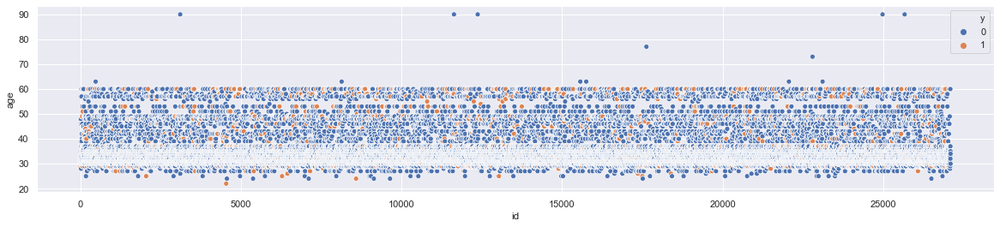

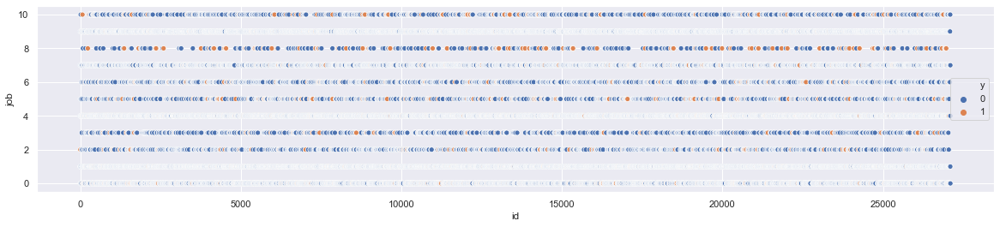

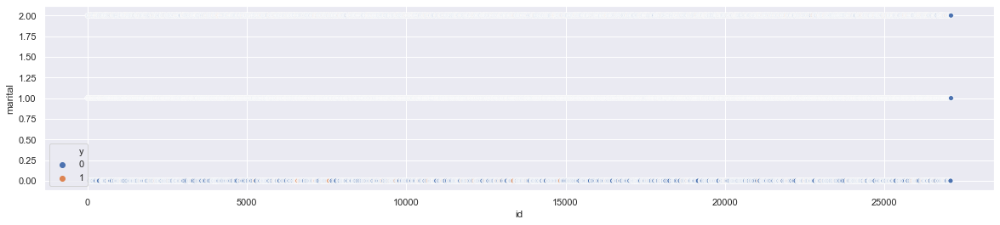

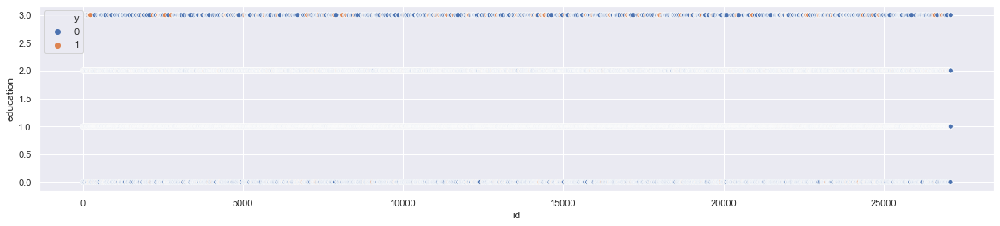

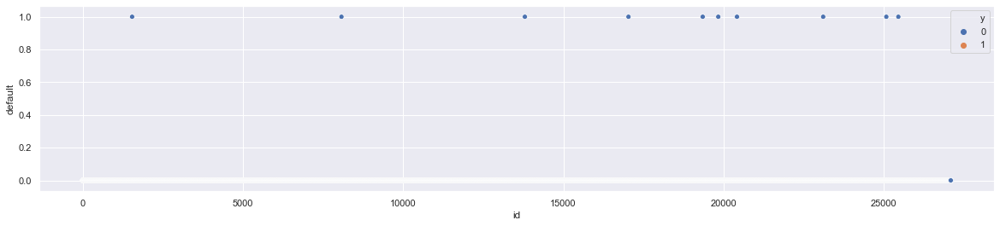

...

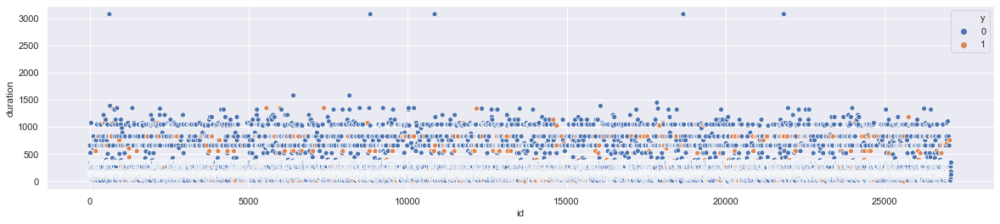

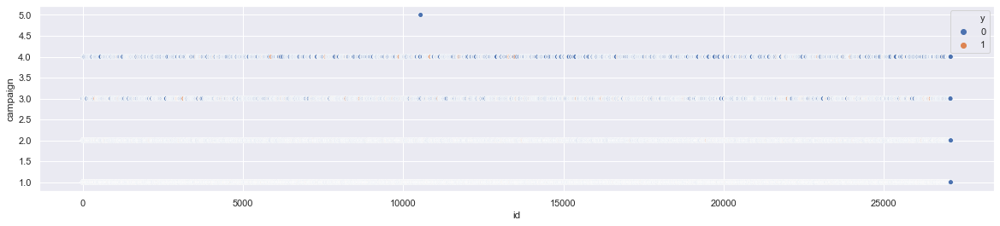

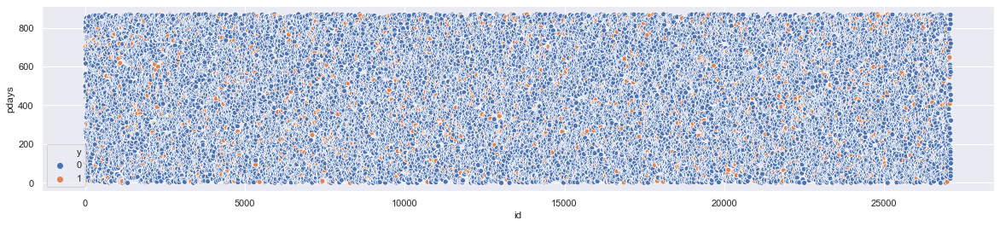

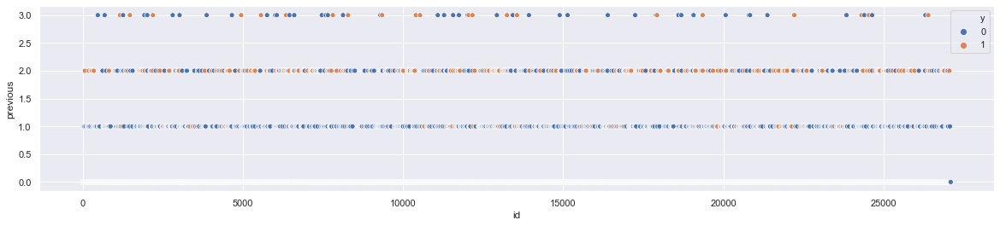

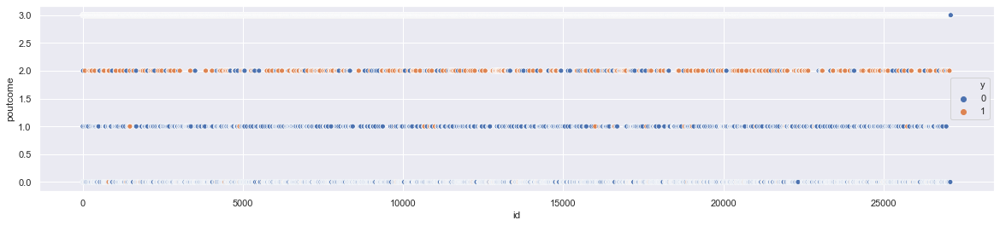

In [11]:
analyze_df = all_df[all_df['y'] != -999]

for col in analyze_df.columns.drop('y'):
    plt.figure(figsize=(20, 4))
    sns.scatterplot(x=analyze_df.index, y=col, hue="y", data=analyze_df)


In [12]:
analyze_df

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y
id,,,,,,,,,,,,,,,,,
0,31,7,1,1,0,12294,1,0,0,21,8,101,3,498,0,1,0
1,29,2,2,2,0,43027,0,0,0,22,1,158,2,702,0,3,1
2,35,4,1,2,0,12252,1,0,0,11,8,351,1,826,0,0,0
3,31,9,1,1,0,99121,1,1,2,16,7,658,2,120,0,0,0
4,48,10,1,0,0,42005,1,0,1,3,0,177,1,273,0,3,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27095,37,1,1,1,0,26661,1,0,0,27,7,345,4,425,0,3,0
27096,35,7,1,1,0,42150,1,0,0,27,7,121,1,719,0,3,0
27097,35,7,1,3,0,34531,0,0,0,28,5,177,2,121,0,3,0


In [14]:
analyze_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 27100 entries, 0 to 27099
Data columns (total 17 columns):
 #   Column     Non-Null Count  Dtype
---  ------     --------------  -----
 0   age        27100 non-null  int64
 1   job        27100 non-null  int32
 2   marital    27100 non-null  int32
 3   education  27100 non-null  int32
 4   default    27100 non-null  int32
 5   balance    27100 non-null  int64
 6   housing    27100 non-null  int32
 7   loan       27100 non-null  int32
 8   contact    27100 non-null  int32
 9   day        27100 non-null  int64
 10  month      27100 non-null  int32
 11  duration   27100 non-null  int64
 12  campaign   27100 non-null  int64
 13  pdays      27100 non-null  int64
 14  previous   27100 non-null  int64
 15  poutcome   27100 non-null  int32
 16  y          27100 non-null  int64
dtypes: int32(9), int64(8)
memory usage: 4.0 MB


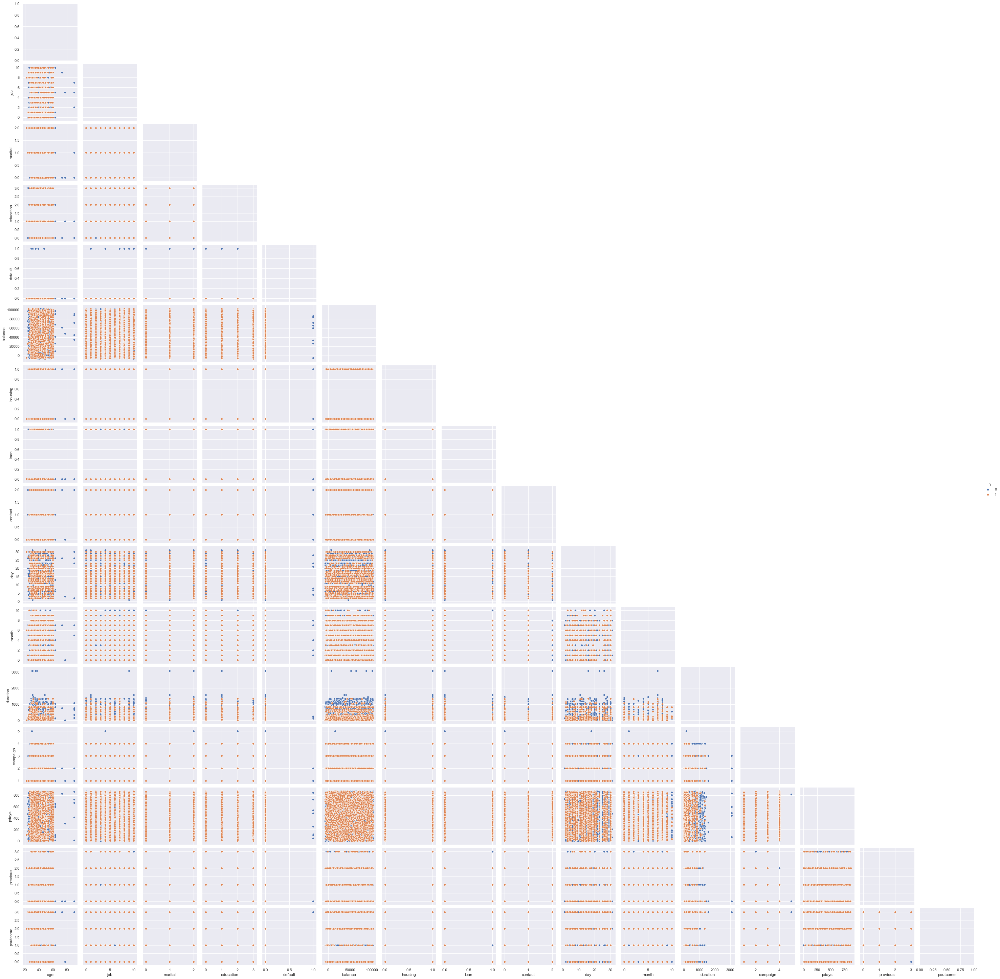

In [15]:
sns.pairplot(analyze_df, hue='y', corner=True, diag_kind="reg")

In [16]:
analyze_df.isnull().any()

age          False
job          False
marital      False
education    False
default      False
balance      False
housing      False
loan         False
contact      False
day          False
month        False
duration     False
campaign     False
pdays        False
previous     False
poutcome     False
y            False
dtype: bool

In [17]:
analyze_df['default'].value_counts()

0    27090
1       10
Name: default, dtype: int64

age job


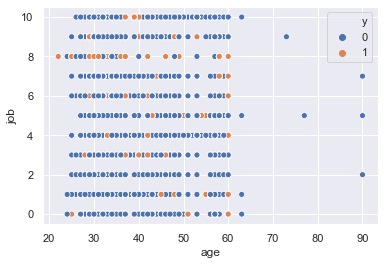

age marital


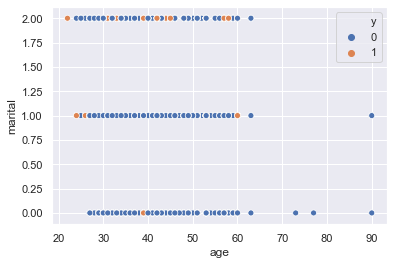

age education


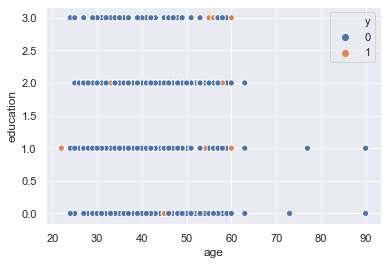

age balance


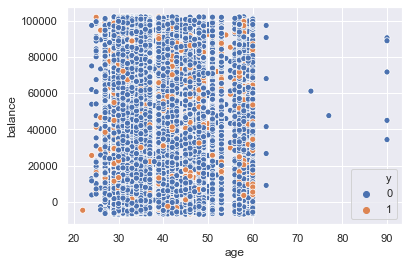

age housing


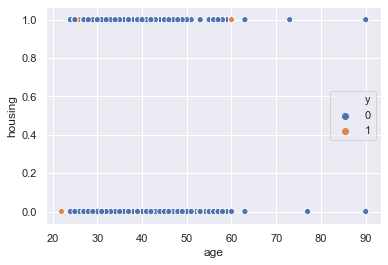

age contact


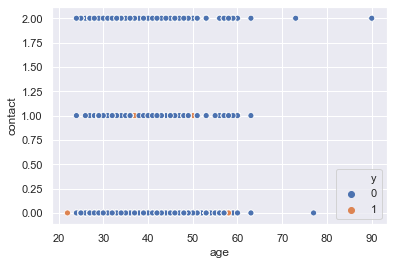

age day


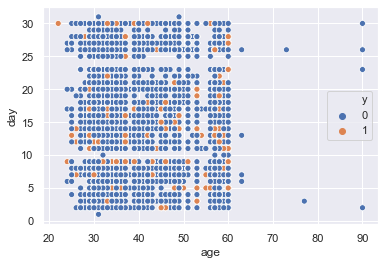

age month


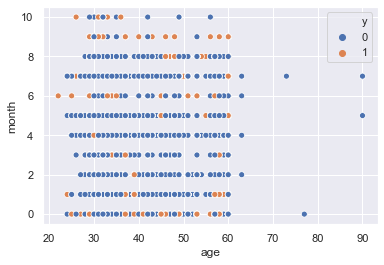

age duration


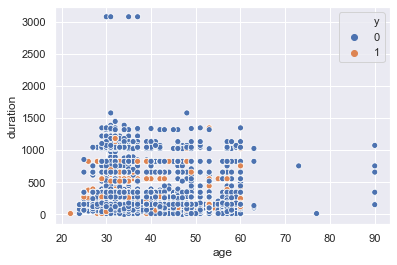

age campaign


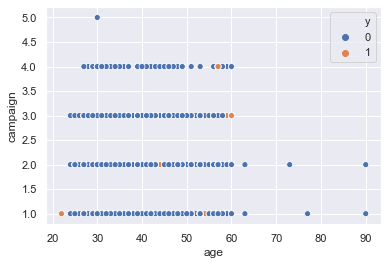

age pdays


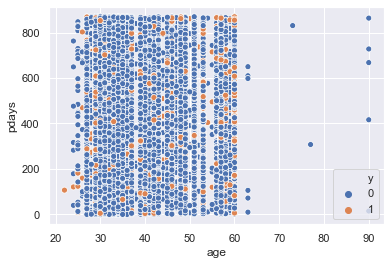

job age


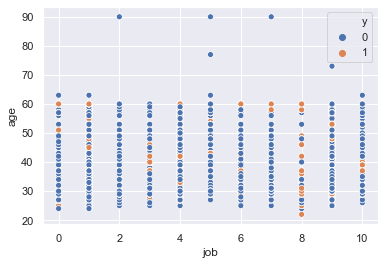

job marital


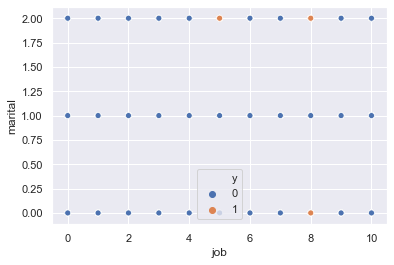

job education


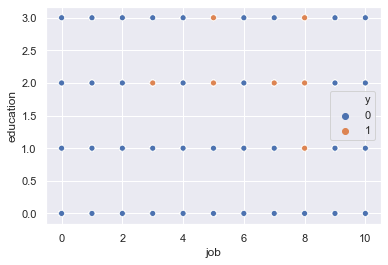

job balance


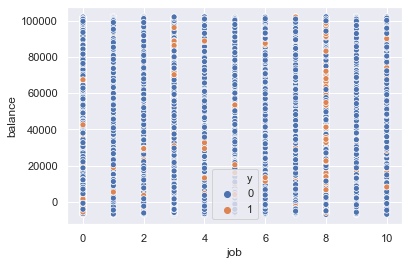

job housing


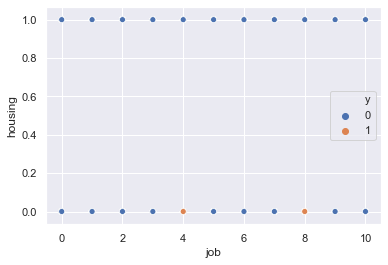

job contact


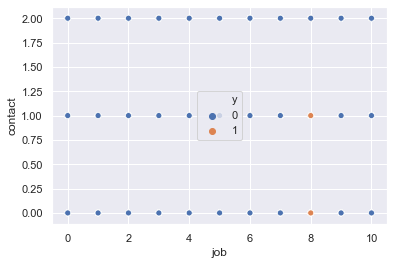

job day


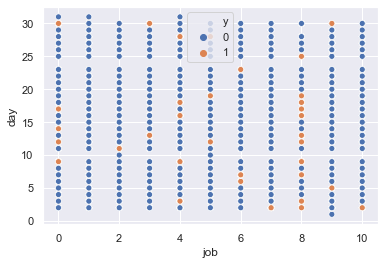

job month


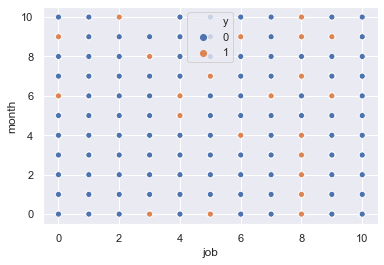

job duration


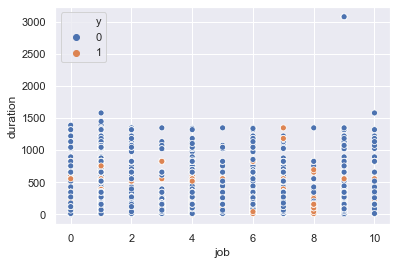

job campaign


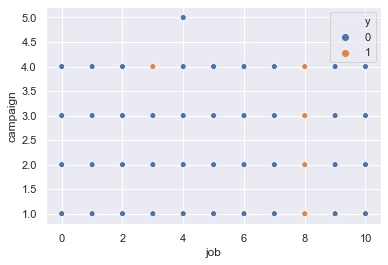

job pdays


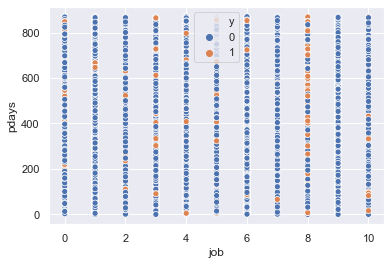

marital age


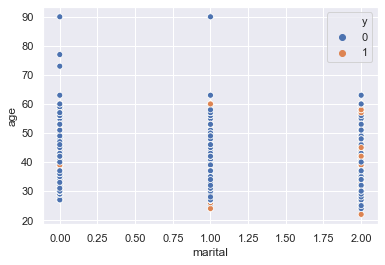

marital job


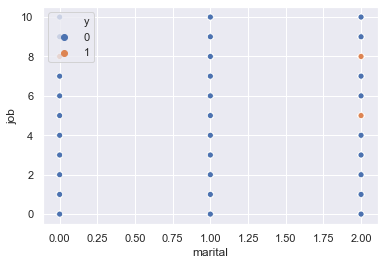

marital education


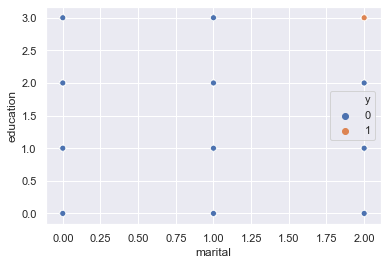

marital balance


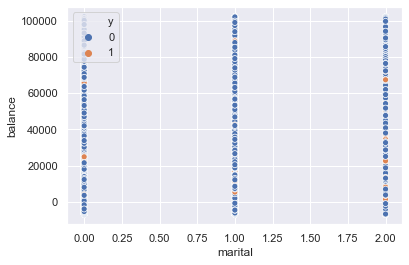

marital housing


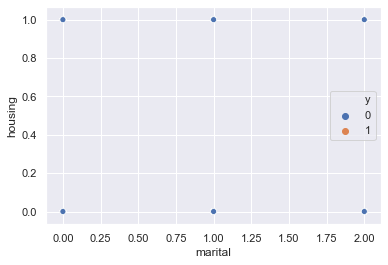

marital contact


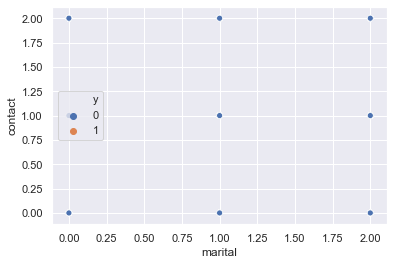

marital day


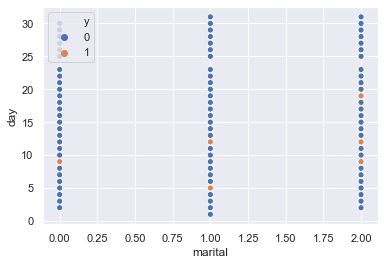

marital month


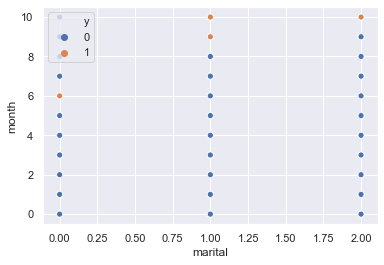

marital duration


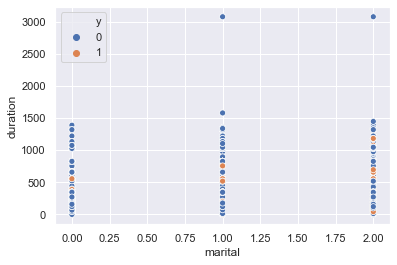

marital campaign


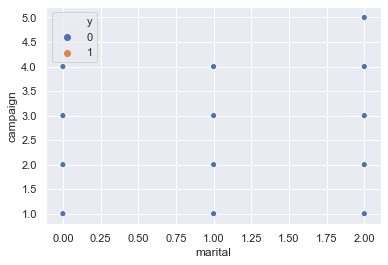

marital pdays


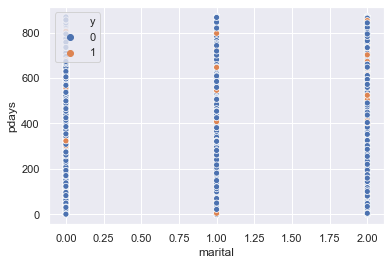

education age


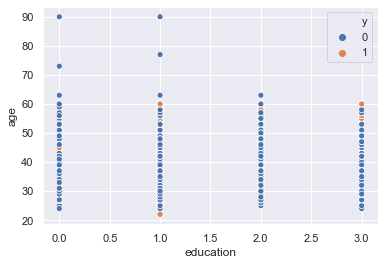

education job


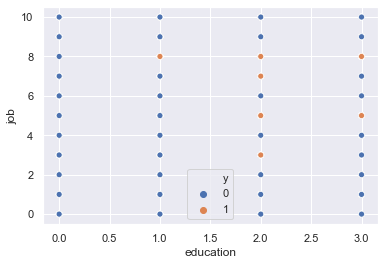

education marital


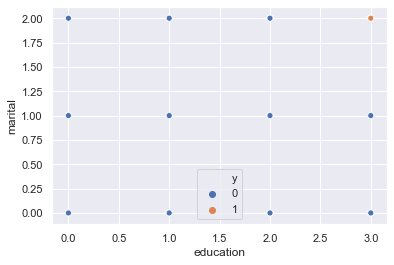

education balance


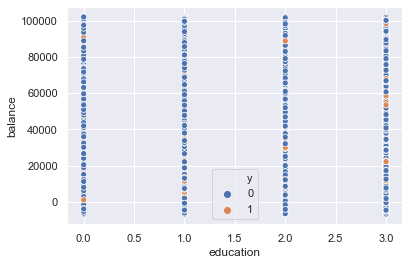

education housing


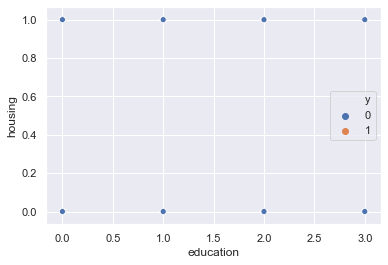

education contact


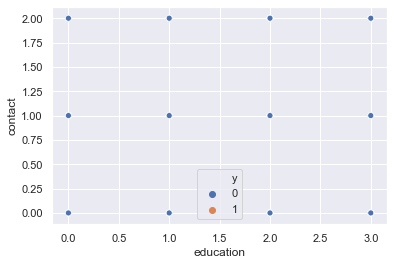

education day


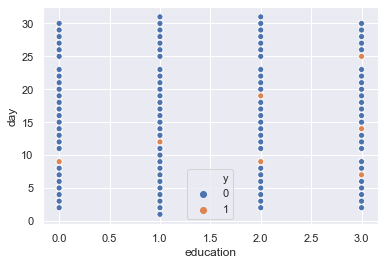

education month


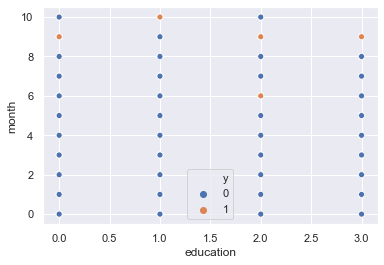

education duration


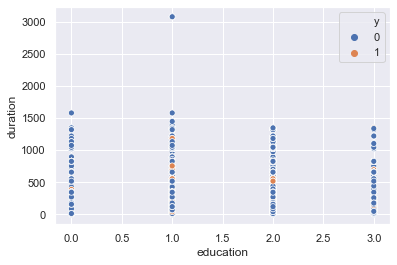

education campaign


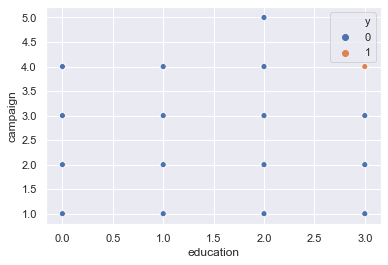

education pdays


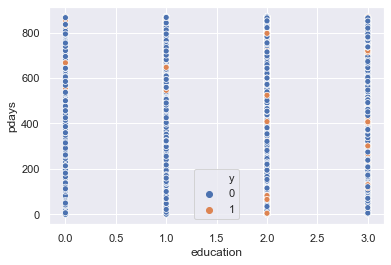

balance age


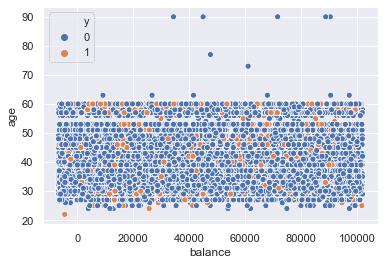

balance job


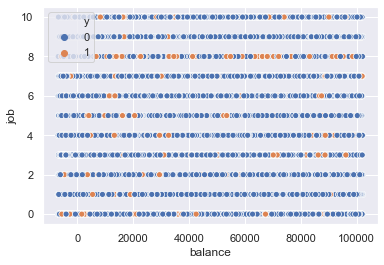

balance marital


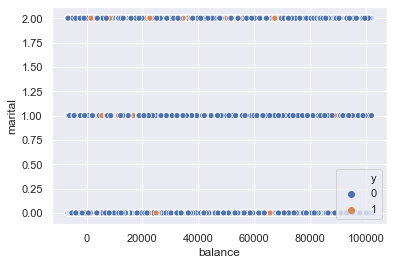

balance education


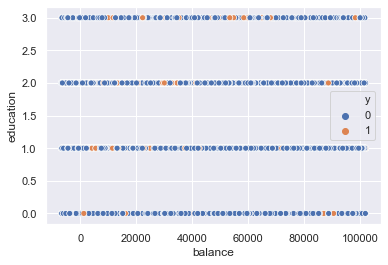

balance housing


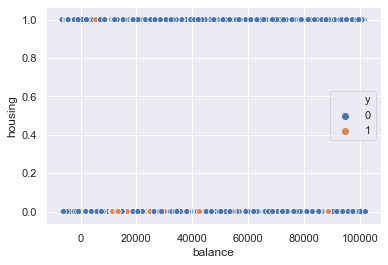

balance contact


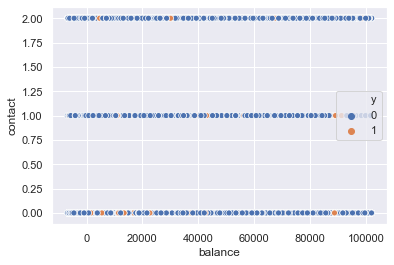

balance day


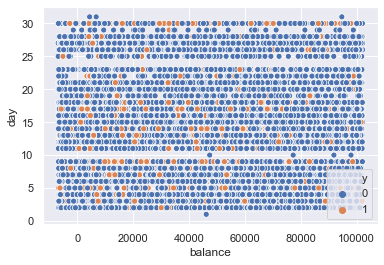

balance month


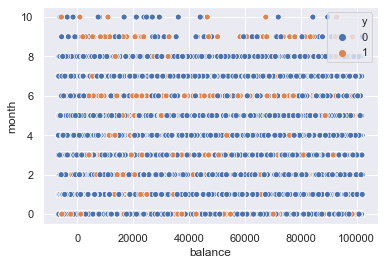

balance duration


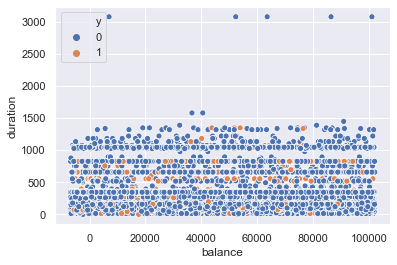

balance campaign


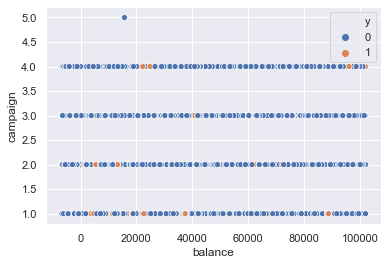

balance pdays


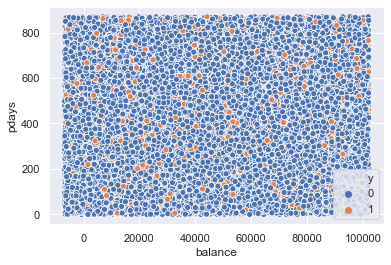

housing age


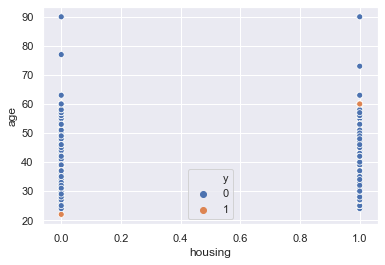

housing job


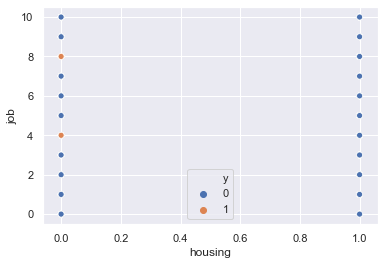

housing marital


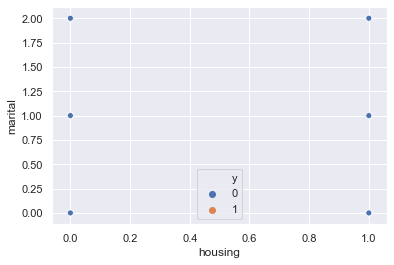

housing education


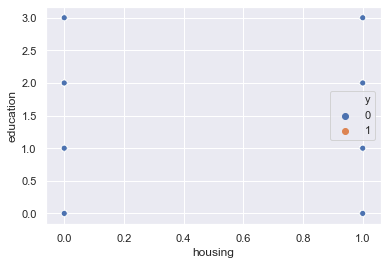

housing balance


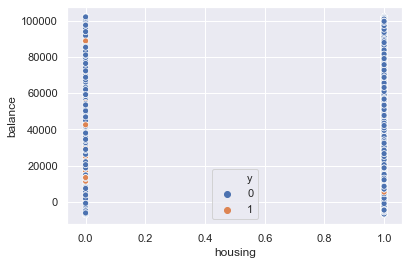

housing contact


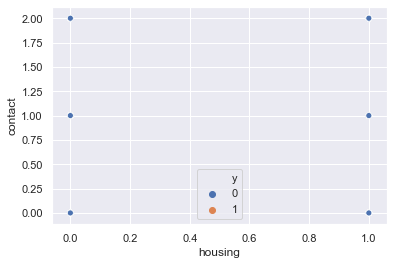

housing day


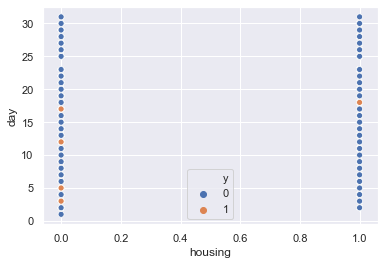

housing month


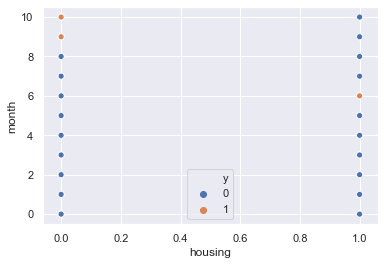

housing duration


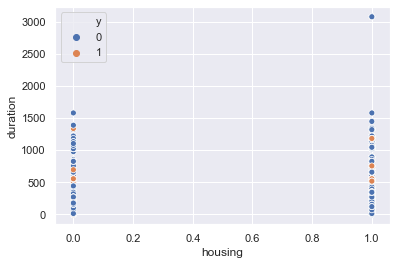

housing campaign


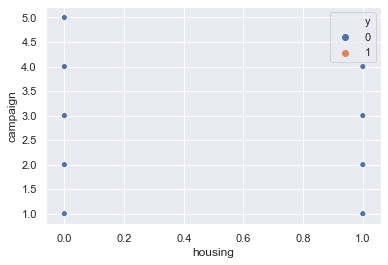

housing pdays


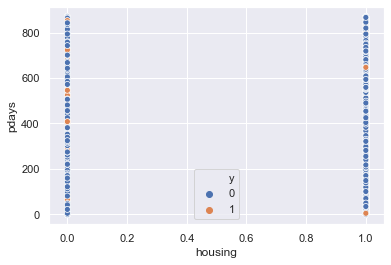

contact age


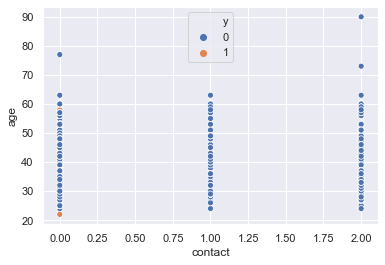

contact job


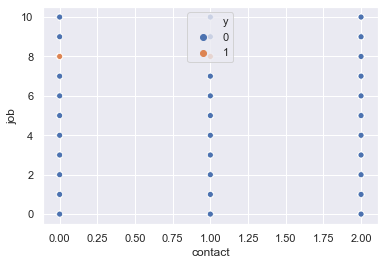

contact marital


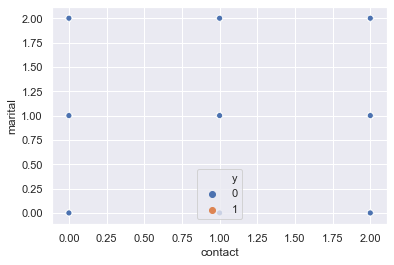

contact education


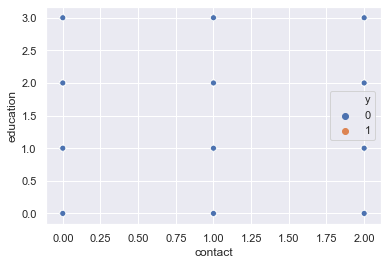

contact balance


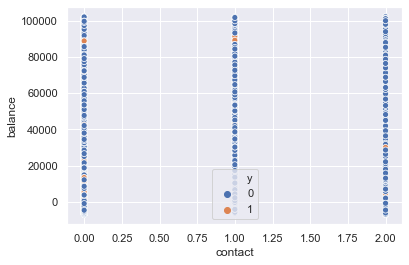

contact housing


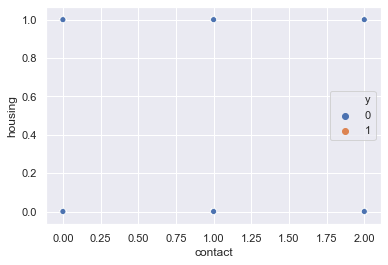

contact day


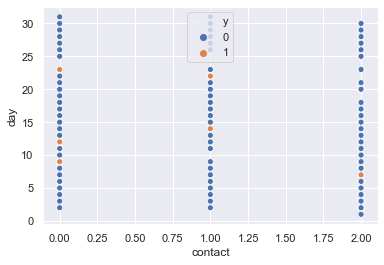

contact month


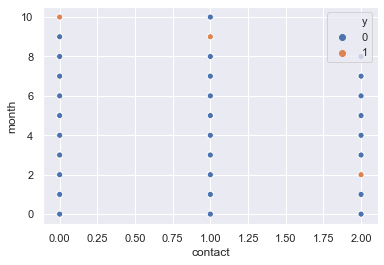

contact duration


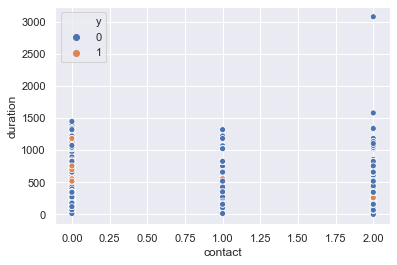

contact campaign


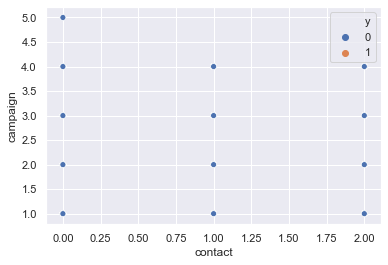

contact pdays


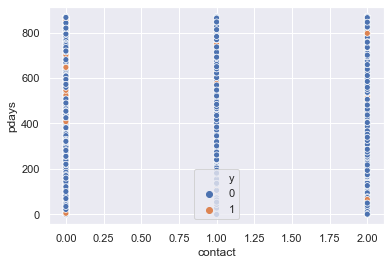

day age


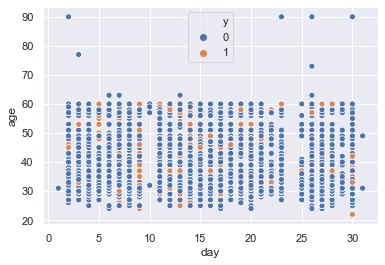

day job


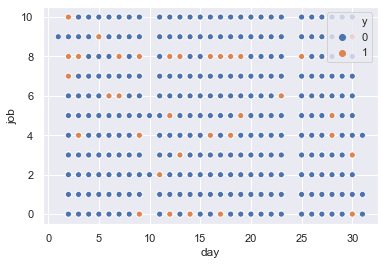

day marital


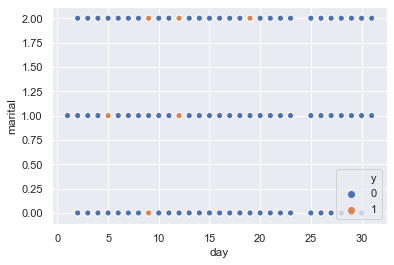

day education


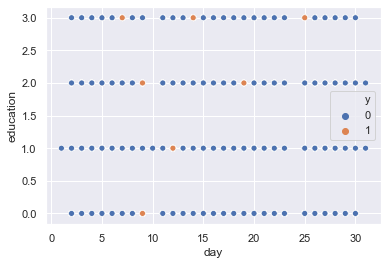

day balance


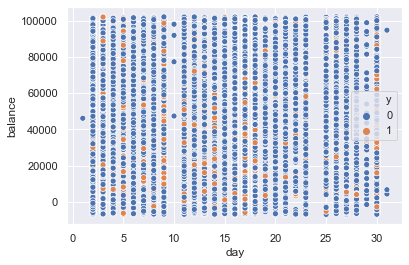

day housing


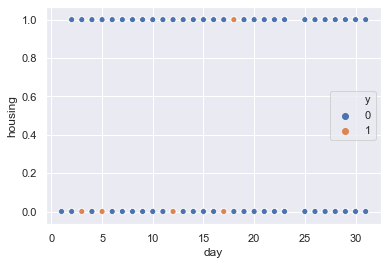

day contact


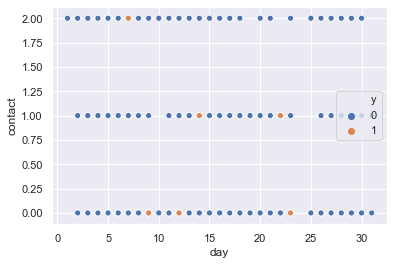

day month


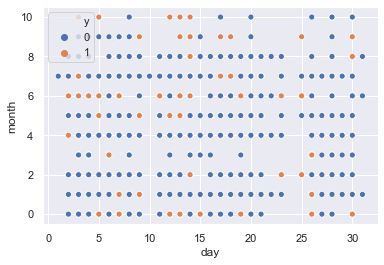

day duration


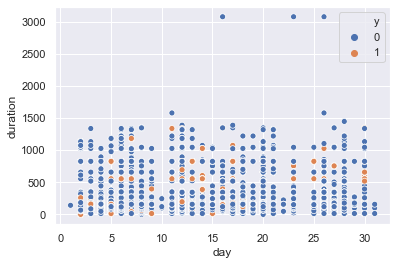

day campaign


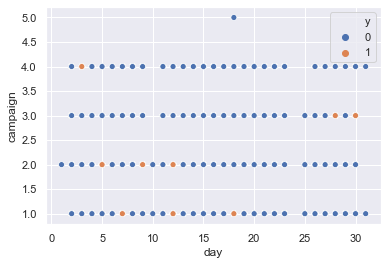

day pdays


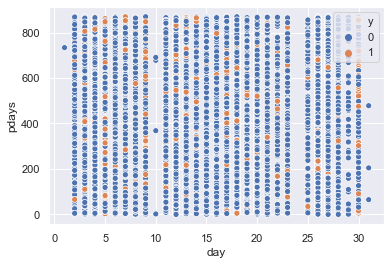

month age


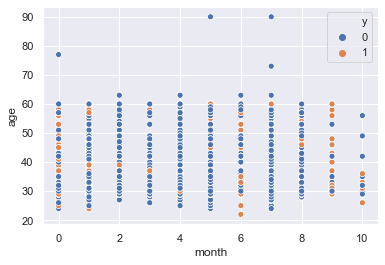

month job


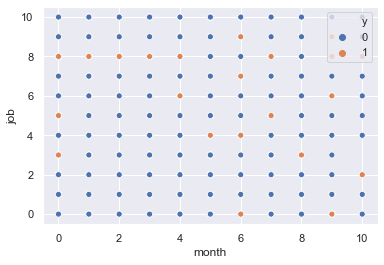

month marital


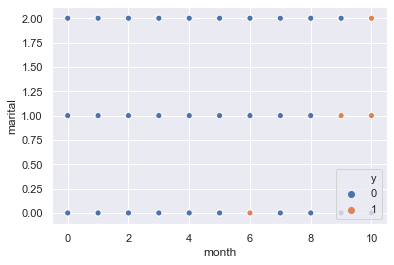

month education


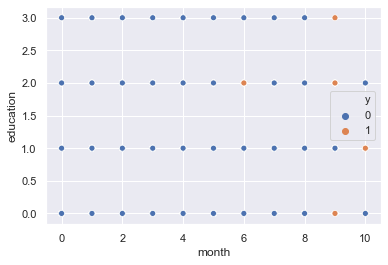

month balance


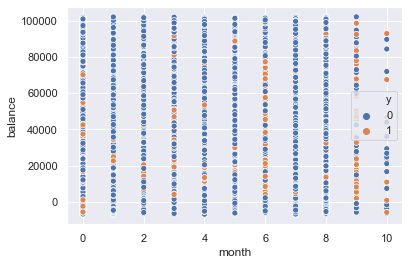

month housing


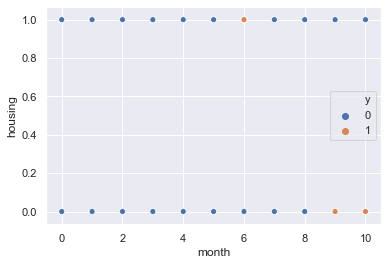

month contact


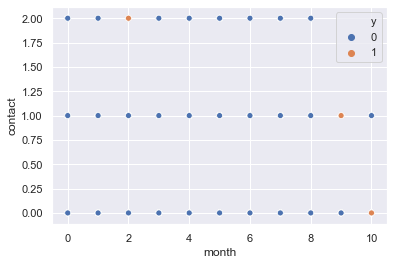

month day


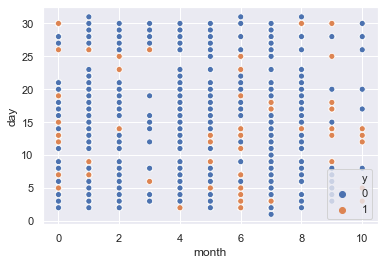

month duration


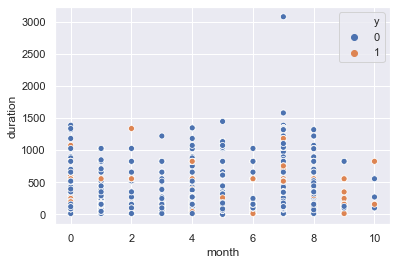

month campaign


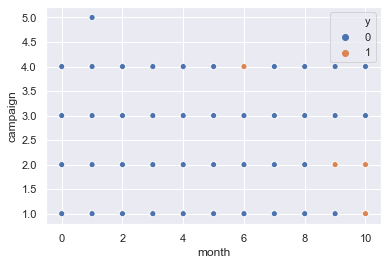

month pdays


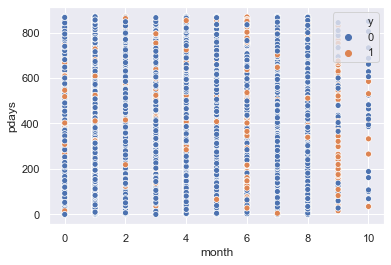

duration age


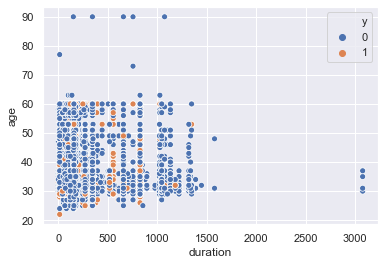

duration job


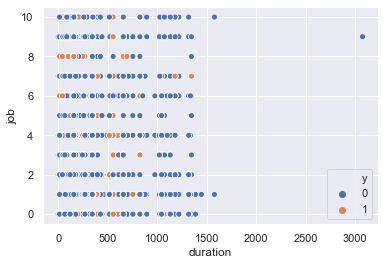

duration marital


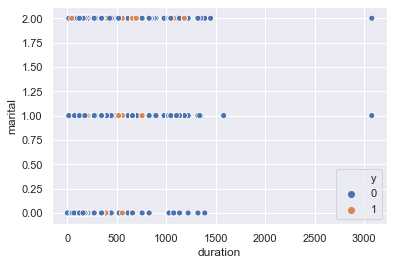

duration education


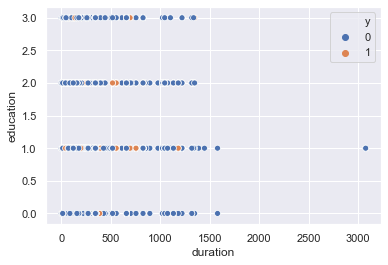

duration balance


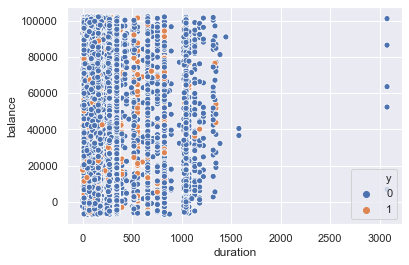

duration housing


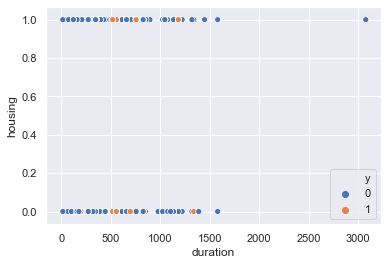

duration contact


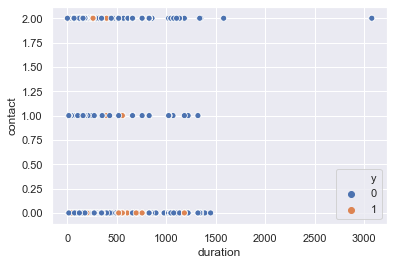

duration day


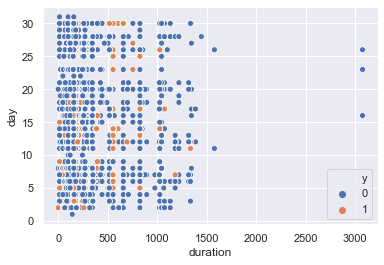

duration month


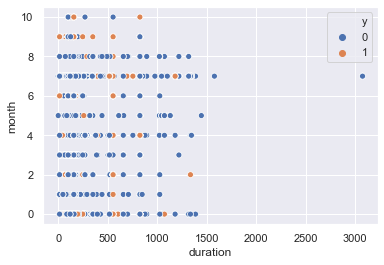

duration campaign


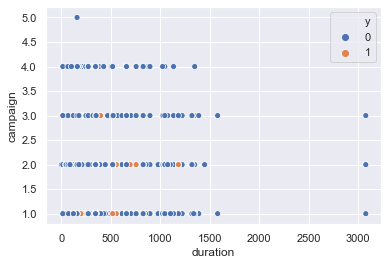

duration pdays


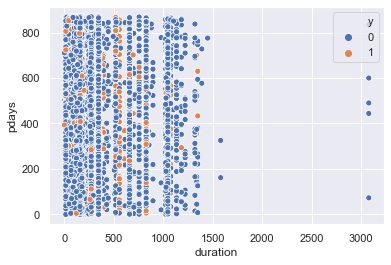

campaign age


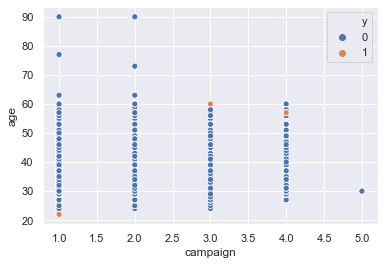

campaign job


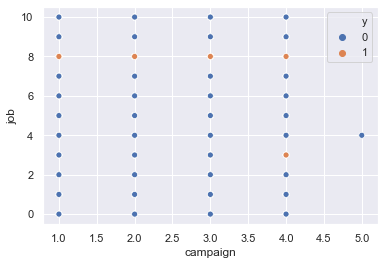

campaign marital


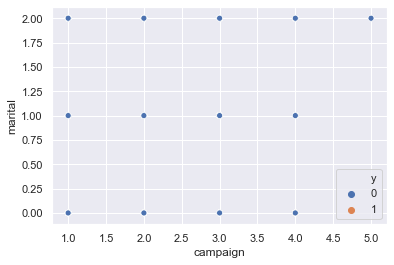

campaign education


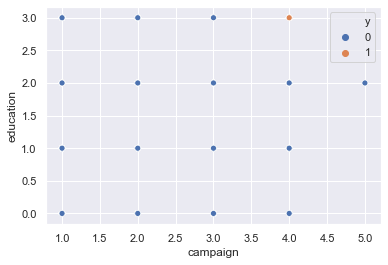

campaign balance


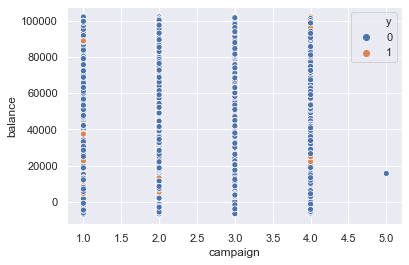

campaign housing


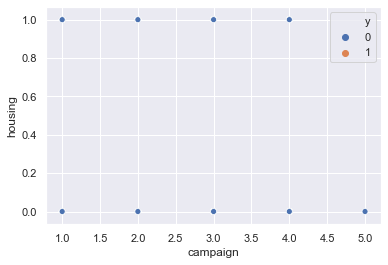

campaign contact


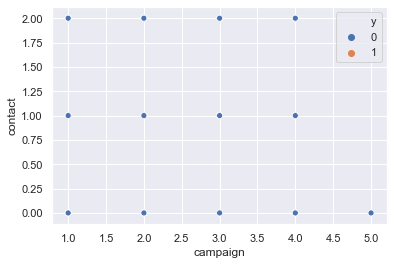

campaign day


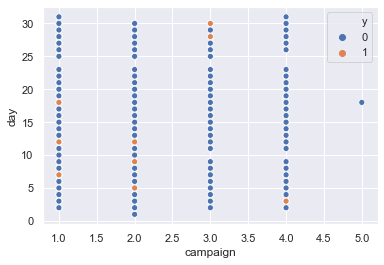

campaign month


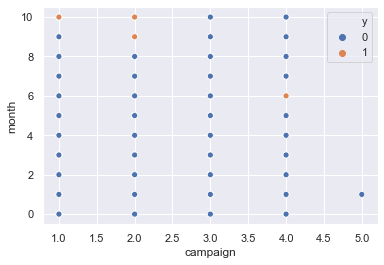

campaign duration


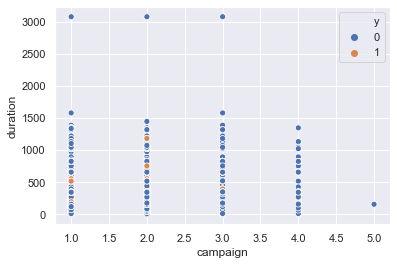

campaign pdays


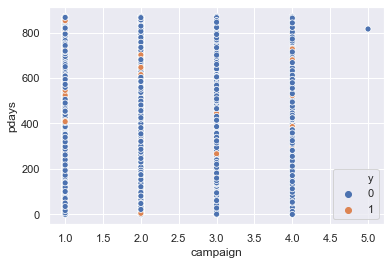

pdays age


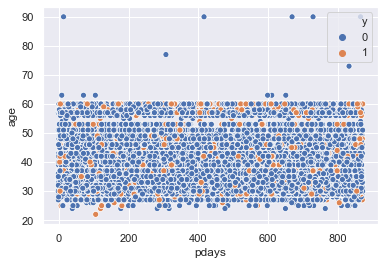

pdays job


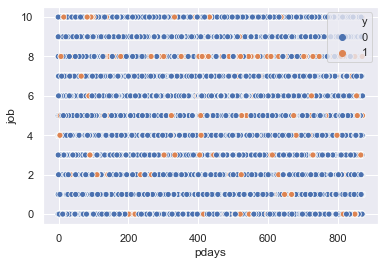

pdays marital


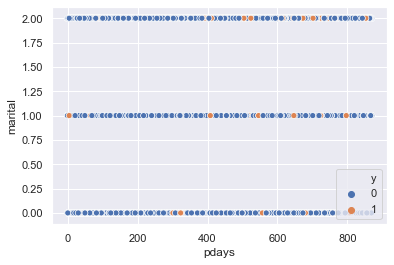

pdays education


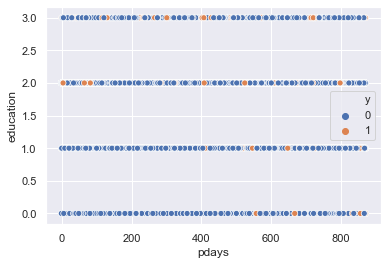

pdays balance


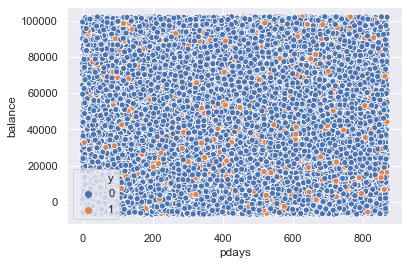

pdays housing


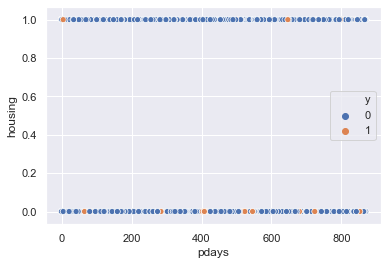

pdays contact


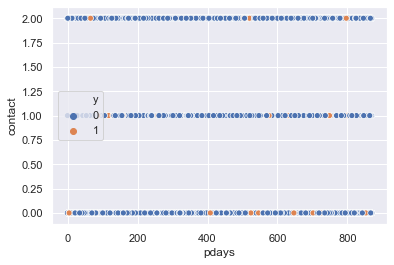

pdays day


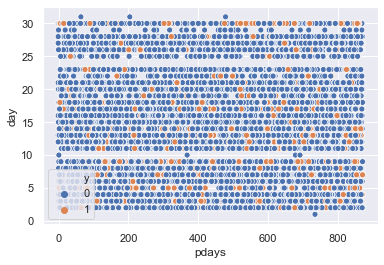

pdays month


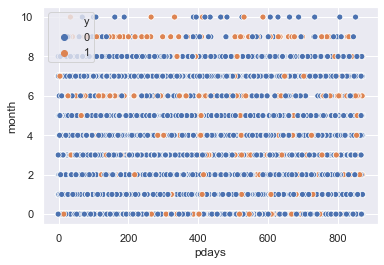

pdays duration


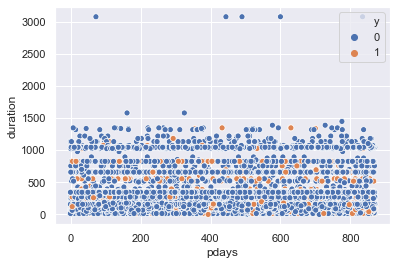

pdays campaign


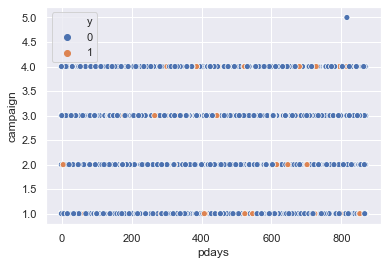

In [22]:
for col1 in analyze_df.columns.drop(['default', 'loan', 'previous', 'poutcome', 'y']):
    for col2 in analyze_df.columns.drop(['default', 'loan', 'previous', 'poutcome', 'y']):
        if col1 != col2:
            print(col1, col2)
            sns.scatterplot(x=col1, y=col2, hue="y", data=analyze_df);
#             sns.catplot(x=col1, y=col2, data=analyze_df, hue='y', kind="swarm")
            plt.show()


## One Hot Encoding

In [ ]:
ce_ohe = ce.OneHotEncoder(handle_unknown='impute')
ce_ohe.fit(all_df.drop('y', axis=1))


In [ ]:
X = ce_ohe.transform(all_df[all_df['y'] != -999].drop('y', axis=1))
y = all_df[all_df['y'] != -999]['y']

In [ ]:
X.shape, y.shape

In [ ]:
X_train, X_valid, y_train, y_valid = train_test_split(X, y, test_size=0.3, random_state=0)

## XGBoost

In [ ]:
# XGBoost が扱うデータセットの形式に直す
xgb_train = xgb.DMatrix(X_train, label=y_train)
xgb_eval = xgb.DMatrix(X_valid, label=y_valid)

# 学習用のパラメータ
xgb_params = {
    'objective': 'binary:logistic', # 二値分類問題
#     'max_depth': 5,
#     'eta': 0.1,
    'eval_metric': 'auc',
    'random_state': 0,
#     'early_stopping_rounds': 10,
}

# モデルを学習する
xgb_model = xgb.train(
    xgb_params, xgb_train,
    evals=[(xgb_train, 'train'), (xgb_eval, 'eval')],
    num_boost_round=500,  # 学習ラウンド数は適当
    verbose_eval=100,
)

In [ ]:
all_pred = pd.DataFrame()

In [ ]:
xgb_y_pred = xgb_model.predict(xgb.DMatrix(X, label=y))
print(xgb_y_pred)

all_pred['xgb'] = xgb_y_pred


In [ ]:
plt.figure(figsize=(20, 4))
plt.scatter(y.index[:1000], y[:1000], alpha=1, label='y')
plt.scatter(y.index[:1000], xgb_y_pred[:1000], alpha=1, label='xgb')
plt.legend()

### for sklearn

In [ ]:
from xgboost import XGBClassifier

xgb = XGBClassifier(objective='binary:logistic', n_estimators=500, eval_metric='auc', random_state=0)
# xgb = XGBClassifier(objective='binary:logistic', max_depth=5, learning_rate=0.1, n_estimators=500, eval_metric='auc', random_state=0, early_stopping_rounds=10)
xgb.fit(X_train, y_train)


In [ ]:
xgb_y_pred = xgb.predict_proba(X)[:,1]
print(xgb_y_pred)

all_pred['xgb_sk'] = xgb_y_pred


In [ ]:
plt.figure(figsize=(20, 4))
plt.scatter(y.index[:1000], y[:1000], alpha=1, label='y')
plt.scatter(y.index[:1000], xgb_y_pred[:1000], alpha=1, label='xgb')
plt.legend()

In [ ]:
importances = xgb.feature_importances_
sns.barplot(importances, X.columns)

### Recursive Feature Elimination

In [ ]:
X.shape

In [ ]:
for i in list(range(16, 5, -1)):
    rfe_xgb = RFE(estimator=xgb, n_features_to_select=i, verbose=1)
    rfe_xgb.fit(X, y)
    
    xgb_y_pred = rfe_xgb.predict_proba(X)[:,1]

    plt.figure(figsize=(20, 4))
    plt.scatter(y.index[:1000], y[:1000], alpha=1, label='y')
    plt.scatter(y.index[:1000], xgb_y_pred[:1000], alpha=1, label='xgb')
    plt.legend()
    plt.show()


## LightGBM

In [ ]:
# 使用モデルはLGB（パラメータチューニング無）
lgb_train = lgb.Dataset(X_train, y_train, categorical_feature=categorical_features)
lgb_eval = lgb.Dataset(X_valid, y_valid, reference=lgb_train, categorical_feature=categorical_features)

lgb_params = {
    'objective': 'binary', 
#     'max_depth': 3,
#     'eta': 0.1,
    'metric': 'auc',
    'random_state': 0,
}

lgb_model = lgb.train(
    lgb_params, lgb_train,
    valid_sets=[lgb_train, lgb_eval],
    verbose_eval=100,
    num_boost_round=500
)


In [ ]:
lgb_model.params

In [ ]:
lgb_y_pred = lgb_model.predict(X, num_iteration=lgb_model.best_iteration)
print(lgb_y_pred)

all_pred['lgb'] = lgb_y_pred


In [ ]:
plt.figure(figsize=(20, 4))
plt.scatter(y.index[:1000], y[:1000], alpha=1, label='y')
plt.scatter(y.index[:1000], lgb_y_pred[:1000], alpha=1, label='lgb')
plt.legend()

### for sklearn

In [ ]:
from lightgbm import LGBMClassifier

lgb = LGBMClassifier(objective='binary', eval_metric='auc', random_state=0, n_estimators=500)
# lgb = LGBMClassifier(objective='binary', max_depth=3, learning_rate=0.1,eval_metric='auc', n_estimators=1000)
lgb.fit(X_train, y_train)

In [ ]:
lgb_y_pred = lgb.predict_proba(X)[:,1]
print(lgb_y_pred)

all_pred['lgb_sk'] = lgb_y_pred


In [ ]:
plt.figure(figsize=(20, 4))
plt.scatter(y.index[:1000], y[:1000], alpha=1, label='y')
plt.scatter(y.index[:1000], xgb_y_pred[:1000], alpha=1, label='lgb')
plt.legend()

In [ ]:
importances = lgb.feature_importances_
sns.barplot(importances, X.columns)

### Recursive Feature Elimination

In [ ]:
for i in list(range(16, 5, -1)):
    rfe_lgb = RFE(estimator=lgb, n_features_to_select=i, verbose=1)
    rfe_lgb.fit(X, y)
    
    lgb_y_pred = rfe_lgb.predict_proba(X)[:,1]

    plt.figure(figsize=(20, 4))
    plt.scatter(y.index[:1000], y[:1000], alpha=1, label='y')
    plt.scatter(y.index[:1000], xgb_y_pred[:1000], alpha=1, label='lgb')
    plt.legend()
    plt.show()


In [ ]:
all_pred['xgb_diff'] = all_pred['xgb'] - all_pred['xgb_sk']
all_pred['lgb_diff'] = all_pred['lgb'] - all_pred['lgb_sk']

In [ ]:
all_pred[(all_pred['xgb_diff'] == 0.0) | (all_pred['lgb_diff'] == 0.0)]

In [ ]:
# sample[1] = pred
# sample.to_csv('submit_20200809_03.csv', index=None, header=None)